In [1]:
# importing required lib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
dataset = pd.read_csv("Zomato Chennai.csv")

In [3]:
dataset.head()

,Zomato URL,Name of Restaurant,Address,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features
0,https://www.zomato.com/chennai/yaa-mohaideen-b...,Yaa Mohaideen Briyani,"336 & 338, Main Road, Pallavaram, Chennai",Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4.3,1500,4.3,9306,"['Home Delivery', 'Indoor Seating']"
1,https://www.zomato.com/chennai/sukkubhai-biriy...,Sukkubhai Biriyani,"New 14, Old 11/3Q, Railway Station Road, MKN ...",Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4.4,3059,4.1,39200,"['Home Delivery', 'Free Parking', 'Table booki..."
2,https://www.zomato.com/chennai/ss-hyderabad-bi...,SS Hyderabad Biryani,"98/339, Arcot Road, Opposite Gokulam Chit Fun...",Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4.3,1361,4.4,10500,"['Home Delivery', 'Indoor Seating']"
3,https://www.zomato.com/chennai/kfc-perambur,KFC,"10, Periyar Nagar, 70 Feet Road, Near Sheeba ...",Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4.0,1101,4.0,11200,"['Home Delivery', 'Free Parking', 'Card Upon D..."
4,https://www.zomato.com/chennai/tasty-kitchen-p...,Tasty Kitchen,"135B, SRP Colony, Peravallur, Near Perambur, ...",Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4.2,617,4.1,22400,"['Home Delivery', 'Indoor Seating']"


In [4]:
dataset.shape

(12032, 12)

In [55]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12032 entries, 0 to 12031
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Zomato URL             12032 non-null  object 
 1   Name of Restaurant     12032 non-null  object 
 2   Address                12032 non-null  object 
 3   Location               12032 non-null  object 
 4   Cuisine                12032 non-null  object 
 5   Top Dishes             12032 non-null  object 
 6   Price for 2            12032 non-null  int64  
 7   Dining Rating          6681 non-null   float64
 8   Dining Rating Count    11812 non-null  object 
 9   Delivery Rating        6181 non-null   float64
 10  Delivery Rating Count  11812 non-null  object 
 11  Features               12032 non-null  object 
dtypes: float64(2), int64(1), object(9)
memory usage: 1.1+ MB


In [5]:
dataset.describe()

,Price for 2,Dining Rating,Delivery Rating
count,12032.000000,6681.000000,6181.000000
mean,397.611370,3.387756,3.805290
std,332.045938,0.558181,0.374213
min,40.000000,0.300000,0.300000
25%,200.000000,3.100000,3.600000
50%,300.000000,3.500000,3.900000
75%,450.000000,3.800000,4.000000
max,5000.000000,4.900000,4.700000


In [6]:
dataset.isnull().sum()

Zomato URL                  0
Name of Restaurant          0
Address                     0
Location                    0
Cuisine                     0
Top Dishes                  0
Price for 2                 0
Dining Rating            5351
Dining Rating Count       220
Delivery Rating          5851
Delivery Rating Count     220
Features                    0
dtype: int64

In [7]:
# URL & address not required for analysis, hence dropping those two 
dataset.drop(["Zomato URL","Address"], axis=1, inplace = True)

In [8]:
dataset.shape

(12032, 10)

In [9]:
# No duplicate records found
temp = dataset["Name of Restaurant"] == "Name of Restaurant"
dataset_dup = dataset[temp]
dataset_dup

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features


In [10]:
dataset.isnull().sum()

Name of Restaurant          0
Location                    0
Cuisine                     0
Top Dishes                  0
Price for 2                 0
Dining Rating            5351
Dining Rating Count       220
Delivery Rating          5851
Delivery Rating Count     220
Features                    0
dtype: int64

In [11]:
import warnings
warnings.filterwarnings('ignore')

In [12]:
# Replace null values with NA
dataset.fillna("NA",inplace= True)

In [13]:
dataset.isnull().sum()

Name of Restaurant       0
Location                 0
Cuisine                  0
Top Dishes               0
Price for 2              0
Dining Rating            0
Dining Rating Count      0
Delivery Rating          0
Delivery Rating Count    0
Features                 0
dtype: int64

In [14]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12032 entries, 0 to 12031
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Name of Restaurant     12032 non-null  object
 1   Location               12032 non-null  object
 2   Cuisine                12032 non-null  object
 3   Top Dishes             12032 non-null  object
 4   Price for 2            12032 non-null  int64 
 5   Dining Rating          12032 non-null  object
 6   Dining Rating Count    12032 non-null  object
 7   Delivery Rating        12032 non-null  object
 8   Delivery Rating Count  12032 non-null  object
 9   Features               12032 non-null  object
dtypes: int64(1), object(9)
memory usage: 940.1+ KB


In [15]:
# converting categorial (NA)  to '0' to make it meaningfull
dataset["Dining Rating"].value_counts()

Dining Rating
NA     5351
3.6     584
3.5     553
3.7     525
3.4     500
3.3     463
3.8     460
3.2     433
3.9     379
3.1     363
2.0     354
3.0     302
4.0     288
2.9     257
4.1     221
2.8     192
4.2     142
2.7     138
4.3     105
2.6      99
2.5      71
4.4      61
2.4      46
4.5      36
2.3      32
2.2      20
4.6      17
4.7      12
2.1      10
4.9       7
4.8       4
1.9       3
1.7       2
0.3       1
1.0       1
Name: count, dtype: int64

In [16]:
dataset["Dining Rating"].replace(to_replace="NA",value=0,inplace=True)

In [17]:
dataset["Dining Rating"].value_counts()

Dining Rating
0.0    5351
3.6     584
3.5     553
3.7     525
3.4     500
3.3     463
3.8     460
3.2     433
3.9     379
3.1     363
2.0     354
3.0     302
4.0     288
2.9     257
4.1     221
2.8     192
4.2     142
2.7     138
4.3     105
2.6      99
2.5      71
4.4      61
2.4      46
4.5      36
2.3      32
2.2      20
4.6      17
4.7      12
2.1      10
4.9       7
4.8       4
1.9       3
1.7       2
0.3       1
1.0       1
Name: count, dtype: int64

In [18]:
dataset["Dining Rating Count"].value_counts()#.index

Dining Rating Count
Does not offer Dining        2603
Not enough Dining Reviews    2528
4                             339
5                             271
6                             248
                             ... 
877                             1
897                             1
872                             1
1197                            1
224                             1
Name: count, Length: 794, dtype: int64

In [19]:
dataset["Dining Rating Count"].replace(to_replace = ["Does not offer Dining","NA","Not enough Dining Reviews"],value=0,inplace=True)

In [20]:
dataset["Delivery Rating"].value_counts()

Delivery Rating
NA     5851
3.9    1383
3.8     701
4.0     570
3.7     559
4.1     468
3.6     465
4.2     401
3.5     314
4.3     277
3.4     259
3.3     189
4.4     128
3.2      93
3.1      79
3.0      63
4.5      55
2.9      39
2.8      26
4.6      24
2.7      19
2.6      17
2.5       9
0.3       8
2.4       7
2.3       5
2.2       5
2.0       5
1.8       5
4.7       4
2.1       2
1.6       1
1.5       1
Name: count, dtype: int64

In [21]:
dataset["Delivery Rating"].replace(to_replace="NA",value=0,inplace=True)

In [22]:
dataset["Delivery Rating Count"].value_counts()

Delivery Rating Count
Not enough Delivery Reviews    3379
Does not offer Delivery        2252
NA                              220
27                               34
37                               30
                               ... 
3530                              1
7705                              1
6374                              1
1773                              1
1617                              1
Name: count, Length: 2282, dtype: int64

In [23]:
dataset["Delivery Rating Count"].replace(to_replace = ["Does not offer Delivery","NA","Not enough Delivery Reviews"],value=0,inplace=True)

In [24]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12032 entries, 0 to 12031
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Name of Restaurant     12032 non-null  object 
 1   Location               12032 non-null  object 
 2   Cuisine                12032 non-null  object 
 3   Top Dishes             12032 non-null  object 
 4   Price for 2            12032 non-null  int64  
 5   Dining Rating          12032 non-null  float64
 6   Dining Rating Count    12032 non-null  object 
 7   Delivery Rating        12032 non-null  float64
 8   Delivery Rating Count  12032 non-null  object 
 9   Features               12032 non-null  object 
dtypes: float64(2), int64(1), object(7)
memory usage: 940.1+ KB


In [27]:
# NA covert to '0'
dataset["Top Dishes"].fillna(0,inplace=True)

In [28]:
dataset["Top Dishes"]

0        ['Bread Halwa', ' Chicken 65', ' Mutton Biryan...
1        ['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...
2        ['Brinjal Curry', ' Tandoori Chicken', ' Chick...
3                                        ['Zinger Burger']
4        ['Mutton Biryani', ' Chicken Rice', ' Tomato R...
                               ...                        
12027                                              Invalid
12028                                              Invalid
12029                                              Invalid
12030                                              Invalid
12031                                              Invalid
Name: Top Dishes, Length: 12032, dtype: object

In [29]:
# Invalid dishes converted to Uncategorized Dish
dataset["Top Dishes"].replace(to_replace = "Invalid",value="Uncategorized Dish",inplace=True)

In [30]:
#converting categorinal into numerical data type
dataset["Delivery Rating Count"] = dataset["Delivery Rating Count"].astype("float64")
dataset["Delivery Rating"] = dataset["Delivery Rating"].astype("int64")
dataset["Dining Rating Count"] = dataset["Dining Rating Count"].astype("float64")
dataset["Dining Rating"] = dataset["Dining Rating"].astype("int64")

In [31]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12032 entries, 0 to 12031
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Name of Restaurant     12032 non-null  object 
 1   Location               12032 non-null  object 
 2   Cuisine                12032 non-null  object 
 3   Top Dishes             12032 non-null  object 
 4   Price for 2            12032 non-null  int64  
 5   Dining Rating          12032 non-null  int64  
 6   Dining Rating Count    12032 non-null  float64
 7   Delivery Rating        12032 non-null  int64  
 8   Delivery Rating Count  12032 non-null  float64
 9   Features               12032 non-null  object 
dtypes: float64(2), int64(3), object(5)
memory usage: 940.1+ KB


In [32]:
dataset.isnull().sum()  # No Null values found

Name of Restaurant       0
Location                 0
Cuisine                  0
Top Dishes               0
Price for 2              0
Dining Rating            0
Dining Rating Count      0
Delivery Rating          0
Delivery Rating Count    0
Features                 0
dtype: int64

In [33]:
dataset.shape

(12032, 10)

In [34]:
# pulling '0' Dining & delivery rating data
unwanted_dining_delivery_rating = (dataset["Dining Rating"]== 0) & (dataset["Delivery Rating"]== 0)
dataset[unwanted_dining_delivery_rating]

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features
1603,Erode Amman Mess,Thiruvanmiyur,"['Chettinad', ' South Indian', ' Kerala', ' Ch...",Uncategorized Dish,600,0,0.0,0,0.0,"['Home Delivery', 'Indoor Seating', 'Table boo..."
2159,The Ultimate Brownie And Chocolate Place,Sholinganallur,"['Bakery', ' Desserts']",Uncategorized Dish,350,0,0.0,0,0.0,"['Delivery Only', 'Desserts and Bakes']"
2419,Amudha Aunty's kitchen,Sholinganallur,"['Tamil', ' South Indian']",Uncategorized Dish,250,0,0.0,0,0.0,"['Breakfast', 'Delivery Only']"
2537,TN 03 CAFE,Tiruvottiyur,"['Sandwich', ' Fast Food', ' Ice Cream', ' Bev...",Uncategorized Dish,200,0,0.0,0,0.0,['Delivery Only']
2542,Maggi Point,Tambaram,"['Fast Food', ' Street Food', ' Beverages']",['Masala Maggi'],500,0,0.0,0,0.0,"['Home Delivery', 'Indoor Seating']"
...,...,...,...,...,...,...,...,...,...,...
12027,CK's Sandwiches,Porur,['Sandwich'],Uncategorized Dish,350,0,0.0,0,0.0,"['Breakfast', 'Delivery Only']"
12028,CK's Sandwiches,Kolathur,['Sandwich'],Uncategorized Dish,350,0,0.0,0,0.0,"['Breakfast', 'Delivery Only']"
12029,CK's Sandwiches,Anna Nagar East,['Sandwich'],Uncategorized Dish,350,0,0.0,0,0.0,"['Breakfast', 'Delivery Only']"
12030,CK's Sandwiches,Ramapuram,['Sandwich'],Uncategorized Dish,350,0,0.0,0,0.0,"['Breakfast', 'Delivery Only']"


In [35]:
dataset = dataset[~unwanted_dining_delivery_rating] # Negation the '0' Dining rating data

In [36]:
dataset.shape

(8473, 10)

In [37]:
dataset[dataset.duplicated()]  # checking for duplicate recods but nothing found as such

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features


In [38]:
# finding fequencey of features
dataset["Features"].value_counts()

Features
['Home Delivery', 'Indoor Seating']                                                                                                                                                                                                   1869
['Home Delivery']                                                                                                                                                                                                                      527
['Delivery Only']                                                                                                                                                                                                                      431
['Breakfast', 'Home Delivery', 'Indoor Seating']                                                                                                                                                                                       355
['Home Delivery', 'Indoor Seating', 'Desserts and B

In [39]:
# Since Zomato is a food delivery partner, hence spliting "Home Delivery" feature alone to see their behavior
tem_df = dataset["Features"].str.split( n=2,  expand = True)
tem_df.head()

,0,1,2
0,['Home,"Delivery',",'Indoor Seating']
1,['Home,"Delivery',","'Free Parking', 'Table booking recommended', '..."
2,['Home,"Delivery',",'Indoor Seating']
3,['Home,"Delivery',","'Free Parking', 'Card Upon Delivery', 'Indoor ..."
4,['Home,"Delivery',",'Indoor Seating']


In [40]:
dataset["Home Delivery"] = tem_df[0]+tem_df[1]
dataset.head()

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']","['HomeDelivery',"
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...","['HomeDelivery',"
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']","['HomeDelivery',"
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...","['HomeDelivery',"
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']","['HomeDelivery',"


In [41]:
#removing unneccary brackets
dataset["Home Delivery"] = dataset["Home Delivery"].str.replace('[','')
dataset.head()

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']","'HomeDelivery',"
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...","'HomeDelivery',"
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']","'HomeDelivery',"
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...","'HomeDelivery',"
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']","'HomeDelivery',"


In [44]:
# removing unwanted comma 
dataset["Home Delivery"] = dataset["Home Delivery"].str.replace(',','')
dataset["Home Delivery"].head(25)

0             'HomeDelivery'
1             'HomeDelivery'
2             'HomeDelivery'
3             'HomeDelivery'
4             'HomeDelivery'
5             'HomeDelivery'
6            'HomeDelivery']
7           'Breakfast''Home
8             'HomeDelivery'
9           'Breakfast''Home
10          'Breakfast''Home
11            'HomeDelivery'
12            'HomeDelivery'
13            'HomeDelivery'
14          'Breakfast''Home
15    'Breakfast''Vegetarian
16            'HomeDelivery'
17            'HomeDelivery'
18                  'FullBar
19            'HomeDelivery'
20            'HomeDelivery'
21          'Breakfast''Home
22            'HomeDelivery'
23                  'FullBar
24          'Breakfast''Home
Name: Home Delivery, dtype: object

In [45]:
# In Home delivery still able to see 'Breakfast''Home, hence removed and make Home delivery alone in its col
dataset["Home Delivery"].replace(to_replace=["'Breakfast''Home","'DeliveryOnly']","'IndoorSeating']","'VegetarianOnly'","'TakeawayOnly'","'Breakfast''Vegetarian","'Breakfast''Catering","'HomeDelivery']"],value ='',inplace = True)

In [48]:
dataset["Home Delivery"].shape

(8473,)

In [49]:
dataset = dataset.copy()  # Analysed data copied back to the original dataset

In [53]:
dataset.head()

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'


# <font color = 'Red'>                  Exploratory Data Analysis<font/>

### Q1) How many type of cuisine available in Chennai restaurants?

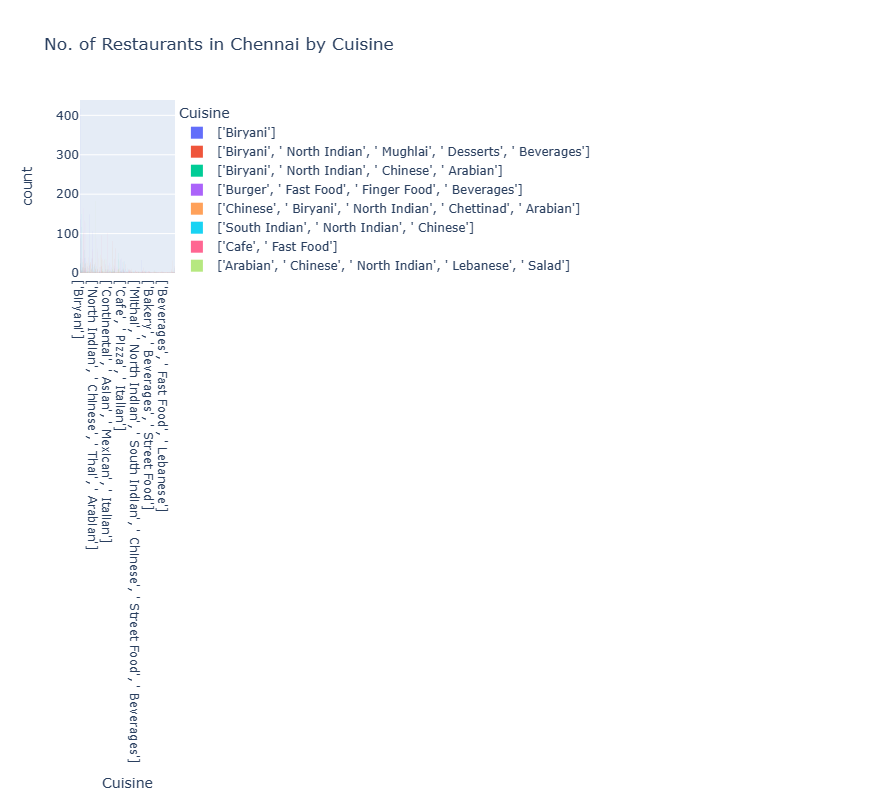

In [56]:
fig = px.histogram(dataset, x="Cuisine", color='Cuisine', 
                   title= 'No. of Restaurants in Chennai by Cuisine',)
fig.update_layout(width=1500, height=800)
fig.show()

###  Q2) How many restaurants are in Chennai for each type of Cuisines?

In [54]:
fig = px.histogram(dataset, x="Name of Restaurant", color="Cuisine", 
                   title= 'No. of Restaurants in Chennai by Cusinie',)
fig.update_layout(width=1300, height=800)
fig.show()

### Q3) Which are the Top 10 rated Seafood Restaurant in Chennai?

In [59]:
sea_food_1 = dataset[dataset["Cuisine"].str.contains("Seafood")]
sea_food = sea_food_1.sort_values(by="Dining Rating", ascending = False).head(10)
sea_food

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
14,Hotel Paramount,Kilpauk,"['North Indian', ' Chinese', ' Seafood', ' Sou...","['Biryani', ' Butter Chicken', ' Tandoori Chic...",500,4,1266.0,4,17700.0,"['Breakfast', 'Home Delivery', 'Indoor Seating...",
353,Mirchi Cuisine,Thuraipakkam,"['Seafood', ' North Indian', ' Chinese', ' And...","['Tandoori Chicken', ' Hyderabadi Biryani', ' ...",850,4,547.0,3,2001.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
376,China Town,Gopalapuram,"['Chinese', ' Seafood']","['Momos', ' Dragon Chicken', ' Chicken Momo', ...",1200,4,468.0,4,637.0,"['Home Delivery', 'Table reservation required'...",'HomeDelivery'
380,Locofeast,Nungambakkam,"['North Indian', ' Continental', ' Seafood', '...","['Pasta', ' Fried Rice', ' Naan', ' Biryani', ...",800,4,400.0,3,61.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
413,Waters Edge Cafe - Radisson BLU Temple Bay,"Radisson Blu Temple Bay, Mamallapuram","['Cafe', ' South Indian', ' North Indian', ' M...","['Breakfast Buffet', ' Tiramisu', ' Sea Food',...",3000,4,274.0,0,0.0,"['Breakfast', 'Wheelchair Accessible', 'Full B...",'Breakfast''Wheelchair
429,Above Sea Level - The Raintree,"The Raintree, Alwarpet","['Continental', ' Mughlai', ' North Indian', '...","['Sea Food', ' Cocktails', ' Wine', ' Pasta', ...",3000,4,383.0,0,0.0,"['Home Delivery', 'Full Bar Available', 'Wifi'...",'HomeDelivery'
434,Anise - Taj Coromandel,"Taj Coromandel, Nungambakkam","['North Indian', ' South Indian', ' Italian', ...","['Gilli Biryani', ' Chocolate Icecreams', ' Mo...",3000,4,375.0,0,0.0,"['Breakfast', 'Wheelchair Accessible', 'Full B...",'Breakfast''Wheelchair
465,Al Beck,Ambattur,"['Seafood', ' Biryani', ' North Indian', ' Chi...","['Shawarma', ' Chicken Grill', ' Barbeque Chic...",800,4,383.0,4,2397.0,"['Home Delivery', 'Free Parking', 'Indoor Seat...",'HomeDelivery'
473,Dynasty,"Harrisons Hotel, Nungambakkam","['Chinese', ' Seafood']","['Momos', ' Golden Fried Prawns', ' Fried Rice...",1200,4,337.0,4,779.0,"['Home Delivery', 'Full Bar Available', 'Valet...",'HomeDelivery'
482,Majestic 1963,Nandanam,"['North Indian', ' Mughlai', ' Seafood', ' Ker...","['Biryani', ' Paratha', ' Fried Rice', ' Mutto...",900,4,296.0,3,851.0,"['Home Delivery', 'Table booking recommended',...",'HomeDelivery'


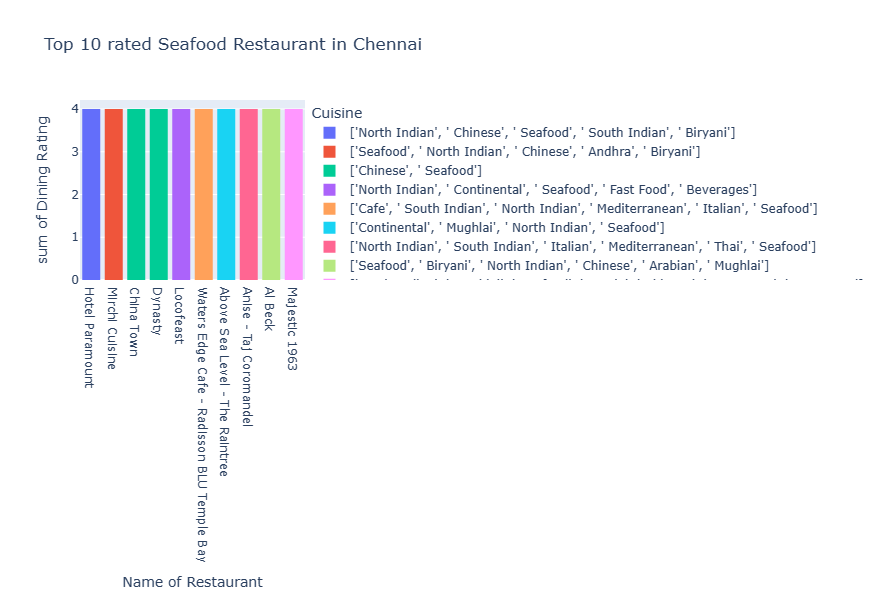

In [60]:
fig = px.histogram(sea_food, x="Name of Restaurant",y="Dining Rating", color='Cuisine', 
                   title= 'Top 10 rated Seafood Restaurant in Chennai',)
fig.update_layout(width=1300, height=600)
fig.show()

### Q4)  What are the percentage of restaurants by Dining Rating in Chennai?

In [75]:
rating_type_df = dataset['Dining Rating'].value_counts().reset_index()
rating_type_df.rename(columns={'index':'DINING RATING', 'count':'COUNT OF RESTAURANTS'}, inplace=True)
rating_type_df

,Dining Rating,COUNT OF RESTAURANTS
0,3,4562
1,0,1793
2,2,1219
3,4,893
4,1,6


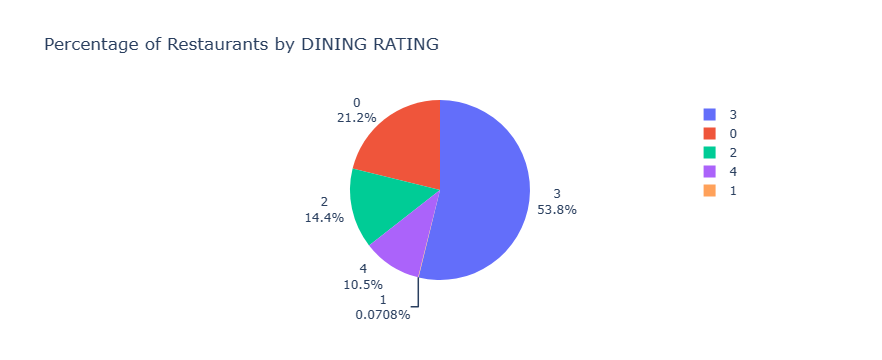

In [79]:
fig = px.pie(rating_type_df, names='Dining Rating', values = 'COUNT OF RESTAURANTS', color = 'Dining Rating',
      title='Percentage of Restaurants by DINING RATING').update_traces(textposition='outside', textinfo='percent+label')
fig.show()

### Q5) Which is the best Food Truck Restaurant in Chennai?

In [90]:
foodtruck_df = dataset[dataset['Name of Restaurant'].str.contains('Food Truck')]
foodtruck_df.sort_values(by='Dining Rating',ascending=False)

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
930,Chaska Food Truck,Thiruvanmiyur,"['Tibetan', ' Chinese', ' Momos']","['Noodle', ' Schezwan Fried Rice', ' Pan Fried...",250,4,190.0,3,376.0,"['Home Delivery', 'Free Parking', 'Self Servic...",'HomeDelivery'
2132,The Food Truck,Ashok Nagar,['Italian'],Uncategorized Dish,300,3,44.0,0,0.0,"['Outdoor Seating', 'Self Service']",'OutdoorSeating'
3855,Poblano - The Food Truck,Perungudi,"['Mexican', ' Chinese']",Uncategorized Dish,300,3,13.0,0,0.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
5731,Chakraa Food Truck,Sholinganallur,"['Chinese', ' North Indian']",Uncategorized Dish,250,2,4.0,0,0.0,"['Outdoor Seating', 'Self Service']",'OutdoorSeating'
4459,Shawarmania Food Truck,Nanganallur,"['Lebanese', ' Chinese']",Uncategorized Dish,400,0,0.0,3,96.0,"['Home Delivery', 'Standing Tables']",'HomeDelivery'
4746,The Engine Food Truck,Taramani,"['North Indian', ' Chinese', ' Fast Food']",Uncategorized Dish,300,0,0.0,2,19.0,"['Home Delivery', 'Standing Tables', 'Self Ser...",'HomeDelivery'


### Q6) Which Restaurant has max delivery rating Count for Home Delivery?

In [99]:
max_delivery = dataset.groupby(by=["Name of Restaurant","Home Delivery","Location"])["Delivery Rating Count"].max().reset_index()
max_delivery.sort_values(by = "Delivery Rating Count", ascending = False)
max_delivery.head()

,Name of Restaurant,Home Delivery,Location,Delivery Rating Count
0,1 Point 2 Devi Mess,'HomeDelivery',Porur,104.0
1,10 Muffins,'HomeDelivery',Medavakkam,0.0
2,101 Dosa,'HomeDelivery',Velachery,261.0
3,11 Inches Pizza,,T. Nagar,18.0
4,11 O Cafe,'HomeDelivery',Perungudi,67.0


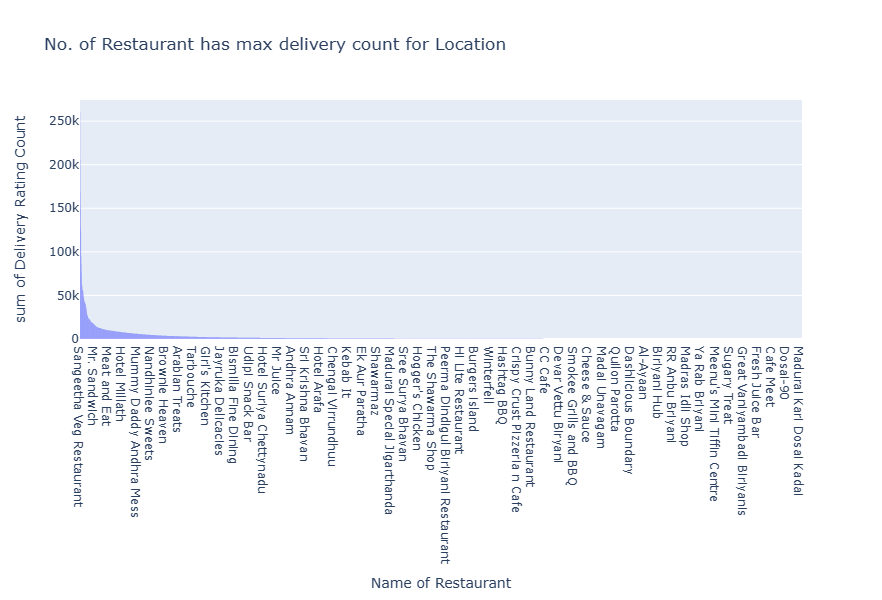

In [102]:
fig = px.histogram(max_delivery, x="Name of Restaurant", y= "Delivery Rating Count",
      title= 'No. of Restaurant has max delivery count for Location').update_xaxes(categoryorder="total descending")

fig.update_layout(width=1000, height=600)
fig.show()

### Q7) Which is the best Biryani Restaurant in Chennai by Dining rating?

In [112]:
biryani_df = dataset[dataset['Cuisine'].str.contains("Biryani")]
biryani_df = biryani_df[dataset['Dining Rating'] >= 2]
biryani_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
13,Dindigul Thalappakatti,Porur,"['South Indian', ' Biryani', ' Chinese', ' Nor...","['Mutton Biryani', ' Faluda', ' Barbeque Chick...",900,4,770.0,4,7670.0,"['Home Delivery', 'Indoor Seating', 'Table res...",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
11237,A.M.S Hyderabad Biriyani & Fast Food,Virugambakkam,"['North Indian', ' Chinese', ' Chettinad', ' B...",Uncategorized Dish,500,3,8.0,0,0.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11239,UBQ by Barbeque Nation,Porur,"['North Indian', ' Biryani']",Uncategorized Dish,500,3,35.0,3,1132.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11640,New Arcot Biriyani,Porur,"['Hyderabadi', ' Biryani']",Uncategorized Dish,250,3,12.0,0,0.0,"['Home Delivery', 'Free Parking', 'Indoor Seat...",'HomeDelivery'
11641,Hotel New Arcot Biriyani & Catering Center,GST Road,"['Chettinad', ' Chinese', ' North Indian', ' B...",Uncategorized Dish,300,3,11.0,0,0.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'


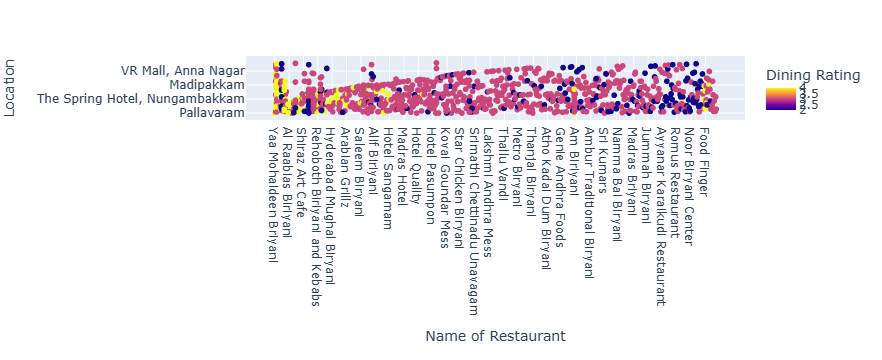

In [113]:
fig = px.scatter(biryani_df, x="Name of Restaurant", y="Location", color= "Dining Rating")

fig.show()

### Q8) Which is the best Biryani Restaurant in Chennai by delivery rating?

In [114]:
biryani_df2 = dataset[dataset['Cuisine'].str.contains("Biryani")]
biryani_df2 = biryani_df2[dataset['Delivery Rating'] >= 2]
biryani_df2

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
6,Bai Veetu Kalyanam,Navallur,['Biryani'],"['Bread Halwa', ' Mutton Biryani', ' Brinjal G...",350,0,0.0,4,1061.0,['Home Delivery'],
...,...,...,...,...,...,...,...,...,...,...,...
11778,Ghulams Biryani,Alandur,['Biryani'],Uncategorized Dish,250,0,0.0,3,12.0,['Home Delivery'],
11780,Ghulams Biryani,Madipakkam,['Biryani'],Uncategorized Dish,250,0,0.0,3,23.0,['Delivery Only'],
11883,Hotel Rahman,Chengalpattu,"['Biryani', ' Chinese', ' Arabian']",Uncategorized Dish,300,0,0.0,3,127.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11886,Hotel Rahman,Medavakkam,"['Biryani', ' Chinese', ' Arabian']",Uncategorized Dish,300,0,0.0,3,101.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'


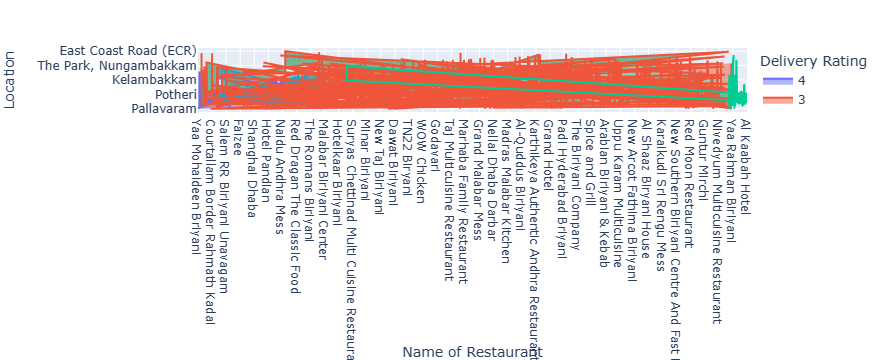

In [121]:
fig = px.area(biryani_df2, x="Name of Restaurant", y="Location", color= "Delivery Rating")
fig.show()

### Q9) Which places have the highest delivery rating restaurant for each Cuisine  in Chennai?

In [122]:
#Assuming restaurants having rating above 4
highest_rated_df = dataset[dataset['Delivery Rating'] >= 4]
highest_rated_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
11665,Juice World,K.K. Nagar,"['Juices', ' Beverages', ' Sandwich', ' Fast F...",Uncategorized Dish,300,3,10.0,4,97.0,"['Home Delivery', 'Vegetarian Only', 'Indoor S...",'HomeDelivery'
11767,Green Crush,Alwarpet,['Beverages'],Uncategorized Dish,200,0,0.0,4,116.0,"['Home Delivery', 'Vegetarian Only']",'HomeDelivery'
11792,OVO and LATTEE,Tambaram,"['Bakery', ' Fast Food']",Uncategorized Dish,400,0,0.0,4,159.0,"['Home Delivery', 'Indoor Seating', 'Desserts ...",'HomeDelivery'
11794,That Juice Shop,Karapakkam,"['Juices', ' Beverages']",Uncategorized Dish,200,3,6.0,4,157.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'


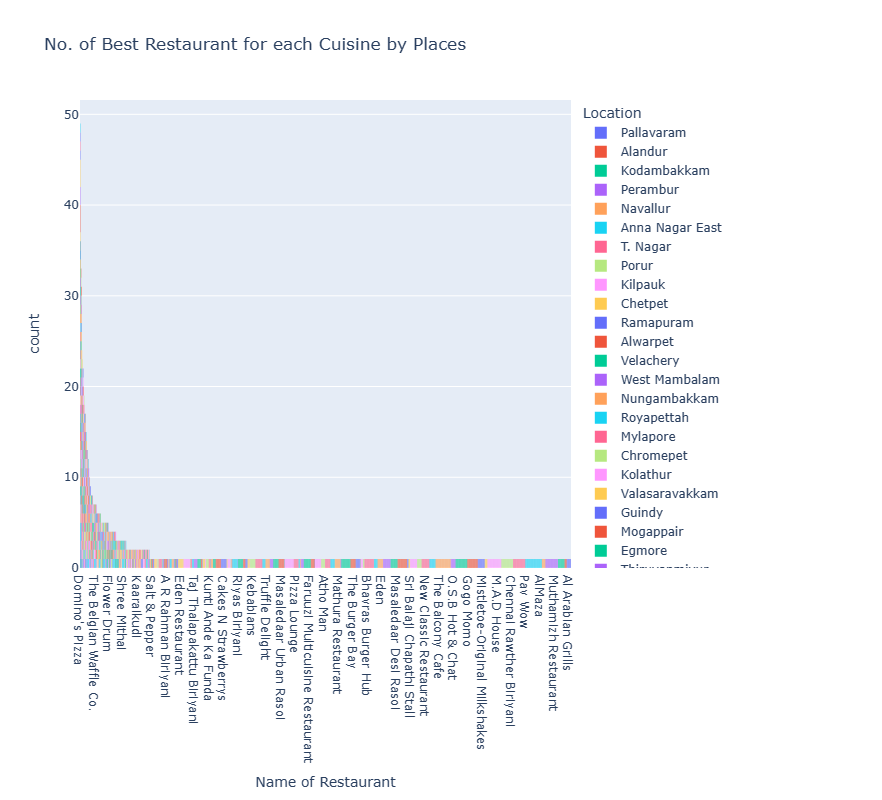

In [129]:
fig = px.histogram(highest_rated_df, color='Location', x='Name of Restaurant',
      title= 'No. of Best Restaurant for each Cuisine by Places').update_xaxes(categoryorder="total descending")
fig.update_layout(width=1000, height=800)
fig.show()

### Q.10) What is the Avg Price Distibution of highest rated restaurant for each Cuisine Type in Chennai?

In [133]:
highest_rated_price_df = highest_rated_df.groupby(by=['Location', 'Cuisine'])['Price for 2'].mean().reset_index()
highest_rated_price_df.rename(columns ={'Location' : 'Location', 'Cuisine' : 'Cuisine','Price for 2':'Price'},inplace = True )
highest_rated_price_df.sort_values(by='Price').head()

,Location,Cuisine,Price
1401,T. Nagar,"['Beverages', ' Ice Cream']",100.0
762,Maduravoyal,['Beverages'],100.0
1417,T. Nagar,"['Desserts', ' Ice Cream', ' Beverages']",100.0
1607,Triplicane,['Street Food'],100.0
1272,Ramapuram,"['Fast Food', ' Mithai']",100.0


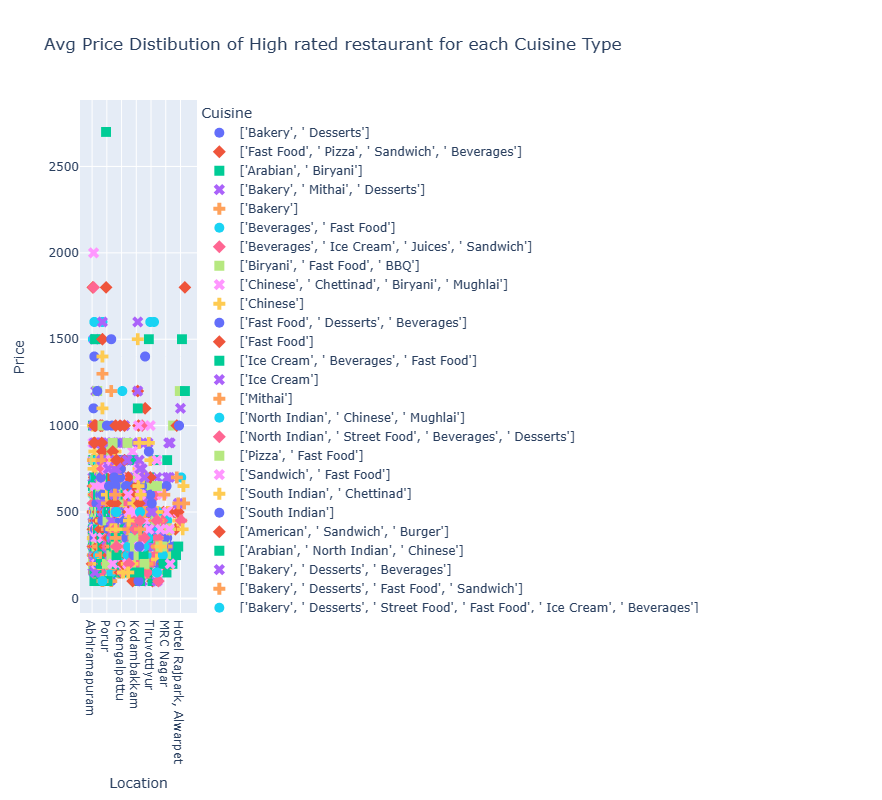

In [134]:
fig = px.scatter(highest_rated_price_df, x="Location", y="Price", color="Cuisine", symbol="Cuisine",
 title=' Avg Price Distibution of High rated restaurant for each Cuisine Type').update_traces(marker_size=10)
fig.update_layout(width=1500, height=800)
fig.show()

### Q.11) Which areas have a largest number of Chinese Restaurant in chennai?

In [135]:
chinese_df = dataset[dataset['Cuisine'].str.contains('Chinese')]
chinese_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
5,Dine N Fun,Medavakkam,"['South Indian', ' North Indian', ' Chinese']","['Chicken Grill', ' Shawarma', ' Naan', ' Chic...",450,4,567.0,3,24700.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
8,Savoury Sea Shell,Anna Nagar East,"['Arabian', ' Chinese', ' North Indian', ' Leb...","['Shawarma', ' Chicken Grill', ' Brownie', ' S...",1400,4,2564.0,4,21700.0,"['Home Delivery', 'Indoor Seating', 'Card Upon...",'HomeDelivery'
9,Sangeetha Veg Restaurant,T. Nagar,"['South Indian', ' North Indian', ' Chinese', ...","['Filtered Coffee', ' Chaat', ' Faluda', ' Mas...",800,4,1578.0,4,39600.0,"['Breakfast', 'Home Delivery', 'Vegetarian Onl...",
...,...,...,...,...,...,...,...,...,...,...,...
11883,Hotel Rahman,Chengalpattu,"['Biryani', ' Chinese', ' Arabian']",Uncategorized Dish,300,0,0.0,3,127.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11886,Hotel Rahman,Medavakkam,"['Biryani', ' Chinese', ' Arabian']",Uncategorized Dish,300,0,0.0,3,101.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11887,Hotel Rahman,Old Mahabalipuram Road (OMR),"['Biryani', ' Chinese', ' Arabian']",Uncategorized Dish,300,0,0.0,3,26.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11959,The Shangai Story,Madipakkam,['Chinese'],Uncategorized Dish,350,0,0.0,2,17.0,['Delivery Only'],


In [136]:
chinese_rest_df = chinese_df.groupby(by='Location').agg({'Name of Restaurant' : 'count', 'Price for 2' : 'mean'}).rename(columns={'Name of Restaurant': 'COUNT OF CHINESE RESTAURANTS', 'Price for 2': 'PRICE'}).reset_index()
chinese_rest_df = chinese_rest_df.sort_values('COUNT OF CHINESE RESTAURANTS', ascending=False)
chinese_rest_df

,Location,COUNT OF CHINESE RESTAURANTS,PRICE
139,Porur,92,445.108696
7,Ambattur,82,395.731707
165,T. Nagar,78,507.051282
195,Velachery,78,533.333333
134,Perambur,76,434.210526
...,...,...,...
143,"Radisson Blu, Egmore",1,2500.000000
63,"Hotel Maurya International, Vadapalani",1,700.000000
64,"Hotel Milestonnez, Kanchipuram District",1,700.000000
65,"Hotel Mount Heera, Alandur",1,900.000000


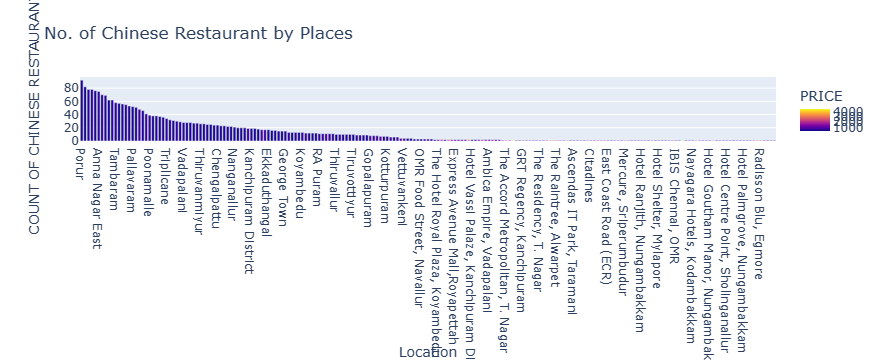

In [137]:
fig = px.bar(chinese_rest_df, x='Location', y='COUNT OF CHINESE RESTAURANTS', color='PRICE', title= 'No. of Chinese Restaurant by Places')
fig.show()

### Q.12) Is there a relation between Price and Delivery Rating by each Cuisine?

In [138]:
price_rating_df = dataset.groupby(['Name of Restaurant', 'Delivery Rating'])['Price for 2'].mean().reset_index()
price_rating_df

,Name of Restaurant,Delivery Rating,Price for 2
0,1 Point 2 Devi Mess,3,300.0
1,10 Muffins,0,200.0
2,101 Dosa,3,300.0
3,11 Inches Pizza,3,450.0
4,11 O Cafe,3,650.0
...,...,...,...
6174,iFoodBox.in,3,200.0
6175,ibaco,0,200.0
6176,ibaco,3,200.0
6177,ibaco,4,200.0


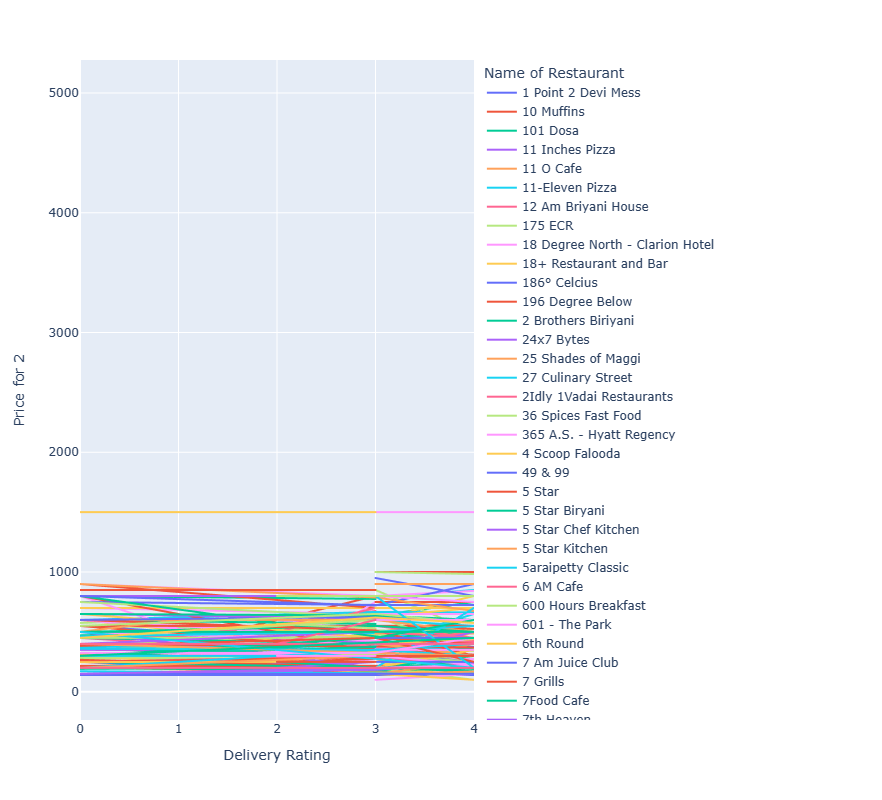

In [141]:
fig = px.line(price_rating_df, y="Price for 2", x="Delivery Rating",color='Name of Restaurant')
fig.update_layout(width=1000, height=800)
fig.show()

### Q.13) Is there a relation between Location and Price?

In [142]:
region_price_df = dataset.groupby(['Location'])['Price for 2'].mean().reset_index()
region_price_df

,Location,Price for 2
0,InterContinental Chennai Mahabalipuram Resort...,1500.000000
1,Abhiramapuram,230.000000
2,"Abu Sarovar Portico, Egmore",1000.000000
3,Adambakkam,308.750000
4,Adyar,476.562500
...,...,...
259,"Vivira Mall, Navallur",500.000000
260,Washermenpet,340.909091
261,"WelcomHotel, RK Salai (Cathedral Road)",2075.000000
262,West Mambalam,273.673469


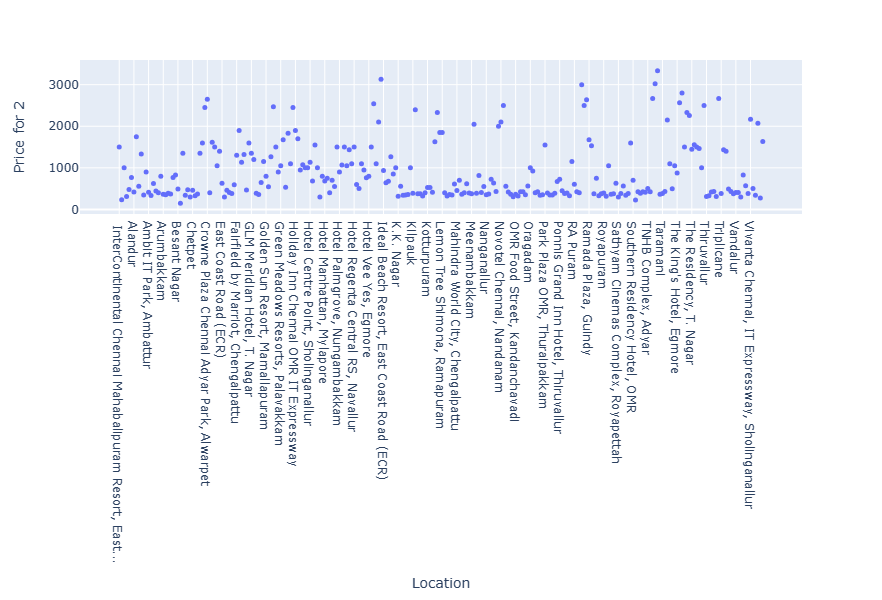

In [143]:
fig = px.scatter(region_price_df, x="Location", y="Price for 2").update_traces(marker_size=5)
fig.update_layout(width=900, height=600)
fig.show()

### Q.14) Find the list of Affordable Restaurants?

###### The criteria for Affordable Restaurants would be:-

1)Low Price 2) High Dining Rated 

First step will be to find the restaurants with average cost 1/4th (1st Quertile) of the most expensive restaurant in our dataframe. Let me explain:-The most expensive restaurant has an average meal cost = 5000. We'll try to stay economical and only pick the restaurants that are 1/4th of 5000.

In [147]:
max_price = dataset["Price for 2"].max()
one_fourth_price = max_price/4
one_fourth_price

1250.0

In [149]:
#Finding list of restaurants that have price less than and equal to 1/4th of the max price i.e Finding Cheap Restaurant
aff_rest_df = dataset[['Name of Restaurant','Location','Cuisine','Price for 2', 'Dining Rating', 'Delivery Rating']]
aff_rest_df = aff_rest_df[aff_rest_df['Price for 2'] <= 1250]
aff_rest_df.sort_values(by='Price for 2', ascending = False, inplace=True)
aff_rest_df

,Name of Restaurant,Location,Cuisine,Price for 2,Dining Rating,Delivery Rating
541,Yaki BBQ,Perungudi,"['Biryani', ' North Indian', ' BBQ', ' South I...",1200,3,3
1752,99 Bar And Grill,Adyar,"['Continental', ' Seafood', ' Chinese', ' Nort...",1200,3,0
582,Quintessence - Hotel Raj Park Chennai,"Hotel Rajpark, Alwarpet","['North Indian', ' Continental']",1200,4,3
5180,Quentina,Grande Bay Resort,['Finger Food'],1200,3,0
343,D Cafe,T. Nagar,"['Cafe', ' European', ' Chinese']",1200,3,0
...,...,...,...,...,...,...
4624,Bommi Mess,T. Nagar,['South Indian'],100,3,0
4185,Perambur Mangala Vilas,Perambur,['Fast Food'],100,3,0
6343,Anjali Juice,Adambakkam,"['Juices', ' Beverages']",100,2,0
1448,Mamee Soup,West Mambalam,['Healthy Food'],60,4,0


In [151]:
highrated_rest_Din_Rat_df = (dataset[dataset["Dining Rating"] >=3])
highrated_rest_Din_Rat_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
11711,London Bakery,Pallavaram,"['Bakery', ' Fast Food', ' Beverages']",Uncategorized Dish,400,3,9.0,0,0.0,"['Home Delivery', 'Indoor Seating', 'Desserts ...",'HomeDelivery'
11736,Adyar Vaishnavas Thattu Idly Kadai,Porur,"['South Indian', ' Sandwich', ' Chinese', ' St...",Uncategorized Dish,200,3,6.0,3,48.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11794,That Juice Shop,Karapakkam,"['Juices', ' Beverages']",Uncategorized Dish,200,3,6.0,4,157.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11801,Amma Unavagam,K.K. Nagar,['South Indian'],Uncategorized Dish,150,3,5.0,0,0.0,"['Breakfast', 'Vegetarian Only', 'Indoor Seati...",


In [152]:
highrated_rest_del_Rat_df = (dataset[dataset["Delivery Rating"] >=3])
highrated_rest_del_Rat_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryan...",500,4,1500.0,4,9306.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...","['Beef Biryani', ' Beef Fry', ' Paratha', ' Pa...",1000,4,3059.0,4,39200.0,"['Home Delivery', 'Free Parking', 'Table booki...",'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...","['Brinjal Curry', ' Tandoori Chicken', ' Chick...",500,4,1361.0,4,10500.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",['Zinger Burger'],500,4,1101.0,4,11200.0,"['Home Delivery', 'Free Parking', 'Card Upon D...",'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...","['Mutton Biryani', ' Chicken Rice', ' Tomato R...",450,4,617.0,4,22400.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
11896,Tirunelveli Halwa Kadai,Pallikaranai,['Mithai'],Uncategorized Dish,200,0,0.0,3,49.0,"['Home Delivery', 'Indoor Seating', 'Desserts ...",'HomeDelivery'
11898,Tirunelveli Halwa Kadai,Selaiyur,['Mithai'],Uncategorized Dish,200,0,0.0,3,43.0,"['Home Delivery', 'Indoor Seating', 'Desserts ...",'HomeDelivery'
11901,Dhabba On Wheels,Okkiyampet,['North Indian'],Uncategorized Dish,500,0,0.0,3,54.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
11914,Sandwich Sisters,Velachery,['Sandwich'],Uncategorized Dish,200,0,0.0,3,75.0,"['Home Delivery', 'Free Parking']",'HomeDelivery'


In [153]:
# Finding the highest rated list of restaurants
highrated_rest_df = dataset[['Name of Restaurant','Location','Cuisine','Price for 2', 'Dining Rating', 'Delivery Rating']]
highrated_rest_df = pd.merge(highrated_rest_Din_Rat_df,highrated_rest_del_Rat_df )
highrated_rest_df.sort_values(by='Price for 2', inplace=True)
highrated_rest_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
1589,Rose Milk Raja,Maduravoyal,['Beverages'],Uncategorized Dish,100,3,46.0,4,150.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
3630,Kulfi Treat,T. Nagar,"['Desserts', ' Ice Cream', ' Beverages']",Uncategorized Dish,100,3,54.0,4,316.0,"['Home Delivery', 'Vegetarian Only', 'Indoor S...",'HomeDelivery'
2383,Iniyavai Delicious Veg Restaurant,Ambattur,['South Indian'],Uncategorized Dish,100,3,8.0,3,45.0,"['Breakfast', 'Home Delivery', 'Vegetarian Onl...",
1121,Hyderabadi Irani Chai,"OMR Food Street, Guduvancheri","['Beverages', ' Fast Food', ' Street Food']",Uncategorized Dish,100,3,78.0,4,814.0,"['Home Delivery', 'Outdoor Seating']",'HomeDelivery'
1799,Cheta Butter Milk,Thousand Lights,['Beverages'],Uncategorized Dish,100,3,30.0,4,254.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
268,Teppan,Alwarpet,['Japanese'],"['Sashimi', ' Nigiri Sushi', ' Maki Roll', ' S...",2000,4,363.0,4,164.0,"['Home Delivery', 'Indoor Seating', 'Table res...",'HomeDelivery'
169,Kipling Cafe,"Kipling, East Coast Road (ECR)","['Continental', ' Thai', ' Italian', ' Bar Food']","['Pizza', ' Beer', ' Cocktails', ' Pasta', ' M...",2400,4,2164.0,3,162.0,"['Home Delivery', 'Full Bar Available', 'Free ...",'HomeDelivery'
175,Punjab Grill,"Phoenix Market City, Velachery","['North Indian', ' Mughlai']","['Biryani', ' Butter Chicken', ' Naan', ' Roti...",2700,4,1907.0,4,353.0,"['Home Delivery', 'Valet Parking Available', '...",'HomeDelivery'
109,601 - The Park,"The Park, Nungambakkam","['Biryani', ' North Indian']","['Pasta', ' Biryani', ' Pizza', ' Salad', ' Lu...",2700,4,825.0,3,128.0,"['Home Delivery', 'Wheelchair Accessible', 'Fu...",'HomeDelivery'


#### Now, we'll merge the aff_rest_df with highrated_rest_df to obtain the intersection i.e the list of Affordable Restaurants!

In [154]:
highrated_aff_df = pd.merge(aff_rest_df, highrated_rest_df, how='inner', on=['Name of Restaurant', 'Location'])
highrated_aff_df = highrated_aff_df[['Name of Restaurant','Location','Cuisine_x','Price for 2_x', 'Dining Rating_x', 'Delivery Rating_x']]
highrated_aff_df.rename(columns={'Name of Restaurant':'Name of Restaurant', 'Price for 2_x':'Price for 2', 'CUSINE_CATEGORY_x':'CUSINE_CATEGORY',
 'Location':'Location', 'Cuisine_x':'Cuisine', 'Dining Rating_x':'Dining Rating','Delivery Rating_x':'Delivery Rating'},inplace=True)

In [155]:
# Affordable Restaurants with low price and high dining and delivery rating 
highrated_aff_df

,Name of Restaurant,Location,Cuisine,Price for 2,Dining Rating,Delivery Rating
0,Yaki BBQ,Perungudi,"['Biryani', ' North Indian', ' BBQ', ' South I...",1200,3,3
1,Quintessence - Hotel Raj Park Chennai,"Hotel Rajpark, Alwarpet","['North Indian', ' Continental']",1200,4,3
2,Toscano,Nungambakkam,"['Italian', ' Continental', ' Fast Food']",1200,4,3
3,Pedreno's,Mylapore,"['Pizza', ' American', ' Italian']",1200,4,4
4,Fennel,"Grand Residence Hotel, Porur","['North Indian', ' Chinese']",1200,3,3
...,...,...,...,...,...,...
3957,Black Pekoe Tea,Velachery,['Tea'],100,3,3
3958,Hyderabadi Irani Chai,"OMR Food Street, Guduvancheri","['Beverages', ' Fast Food', ' Street Food']",100,3,4
3959,Muthu Tiffin Center,Adambakkam,['South Indian'],100,3,3
3960,Madurai Famous Jigarthanda,T. Nagar,"['Beverages', ' Ice Cream']",100,3,4


### Q.15) Find the list of most Reliable Restaurants?

   The criteria for the most Reliable Restaurants would be:-

1) Low Price 2) High delivery rated 3) Large No. of Home Delivery First step will be to find the restaurants with Home Delivery 

In [160]:
reliable1_rest_df = dataset[['Name of Restaurant','Location','Cuisine','Price for 2','Delivery Rating','Home Delivery']]
reliable1_rest_df = pd.merge(highrated_rest_del_Rat_df,aff_rest_df)
reliable1_rest_df.sort_values(by='Price for 2', inplace=True)
reliable1_rest_df

,Name of Restaurant,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features,Home Delivery
2843,The Sandwich And Shakes,Sholinganallur,"['Sandwich', ' Fast Food', ' Beverages']",Uncategorized Dish,100,3,5.0,3,93.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
1499,Rohini Restaurant,Porur,['North Indian'],Uncategorized Dish,100,3,70.0,4,464.0,"['Home Delivery', 'Vegetarian Only', 'Indoor S...",'HomeDelivery'
3064,Vivikta Chapati Shop,Vadapalani,['South Indian'],Uncategorized Dish,100,0,0.0,3,138.0,['Home Delivery'],
3050,Thattu Vadai Settu Kadai,Teynampet,['Street Food'],Uncategorized Dish,100,0,0.0,3,57.0,['Home Delivery'],
3710,Fruit Gallery Juice Shop,Perambur,"['Beverages', ' Juices']",Uncategorized Dish,100,3,5.0,4,451.0,"['Home Delivery', 'Indoor Seating']",'HomeDelivery'
...,...,...,...,...,...,...,...,...,...,...,...
1269,Fennel,"Grand Residence Hotel, Porur","['North Indian', ' Chinese']",Uncategorized Dish,1200,3,59.0,3,793.0,"['Breakfast', 'Home Delivery', 'Wheelchair Acc...",
1874,Aki Bay @ TVR,RA Puram,"['Japanese', ' Asian']",Uncategorized Dish,1200,3,25.0,3,64.0,"['Home Delivery', 'Free Parking', 'Wifi', 'Ind...",'HomeDelivery'
386,Goddy's,Nungambakkam,"['Cafe', ' Continental', ' Italian', ' Fast Fo...","['Pasta', ' Waffles', ' Fries', ' Pancakes', '...",1200,4,254.0,3,245.0,"['Breakfast', 'Home Delivery', 'LGBTQIA Friend...",
291,China Town,Gopalapuram,"['Chinese', ' Seafood']","['Momos', ' Dragon Chicken', ' Chicken Momo', ...",1200,4,468.0,4,637.0,"['Home Delivery', 'Table reservation required'...",'HomeDelivery'


#### These are the most reliable, highest rated and affordable restaurants:-

We obtain this dataframe by simply taking the intersection of highrated_rest_del_Rat_df,aff_rest_df

This dataframe obtained below shows the restaurants whose:

-> Cost is below 1250 -> Delivery Rating is above 3 -> Only Home Delivery ( As it is convinent to be able to delivery whereever required)

In [161]:
reliable_rest_df = pd.merge(highrated_rest_del_Rat_df,aff_rest_df, how='inner', on=['Name of Restaurant', 'Location'])
reliable_rest_df = reliable_rest_df[['Name of Restaurant','Location','Cuisine_x','Price for 2_x', 'Delivery Rating_x','Home Delivery']]
reliable_rest_df.rename(columns={'Name of Restaurant':'Name of Restaurant', 'Price for 2_x':'Price for 2',
 'Location':'Location', 'Cuisine_x':'Cuisine','Delivery Rating_x':'Delivery Rating','Home Delivery':'Home Delivery'},inplace=True)

reliable_rest_df

,Name of Restaurant,Location,Cuisine,Price for 2,Delivery Rating,Home Delivery
0,Yaa Mohaideen Briyani,Pallavaram,['Biryani'],500,4,'HomeDelivery'
1,Sukkubhai Biriyani,Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Des...",1000,4,'HomeDelivery'
2,SS Hyderabad Biryani,Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Ara...",500,4,'HomeDelivery'
3,KFC,Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Bev...",500,4,'HomeDelivery'
4,Tasty Kitchen,Perambur,"['Chinese', ' Biryani', ' North Indian', ' Che...",450,4,'HomeDelivery'
...,...,...,...,...,...,...
6462,Tirunelveli Halwa Kadai,Pallikaranai,['Mithai'],200,3,'HomeDelivery'
6463,Tirunelveli Halwa Kadai,Selaiyur,['Mithai'],200,3,'HomeDelivery'
6464,Dhabba On Wheels,Okkiyampet,['North Indian'],500,3,'HomeDelivery'
6465,Sandwich Sisters,Velachery,['Sandwich'],200,3,'HomeDelivery'
